### Load data

In [1]:
# Load data
import glob
import cv2

vehicles = glob.glob('data/vehicles/**/*.png')
non_vehicles = glob.glob('data/non-vehicles/**/*.png')

cars = list(map(lambda x: cv2.cvtColor(cv2.imread(x), cv2.COLOR_BGR2RGB), vehicles))
non_cars = list(map(lambda x: cv2.cvtColor(cv2.imread(x), cv2.COLOR_BGR2RGB), non_vehicles))
print(len(cars))
print(len(non_cars))

8792
8968


### Examine data images

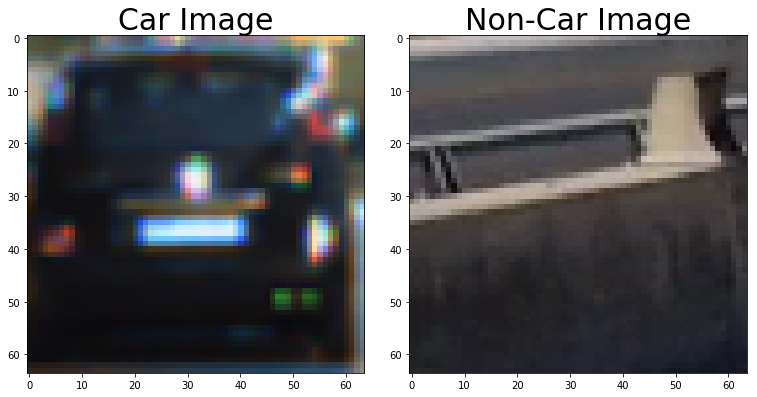

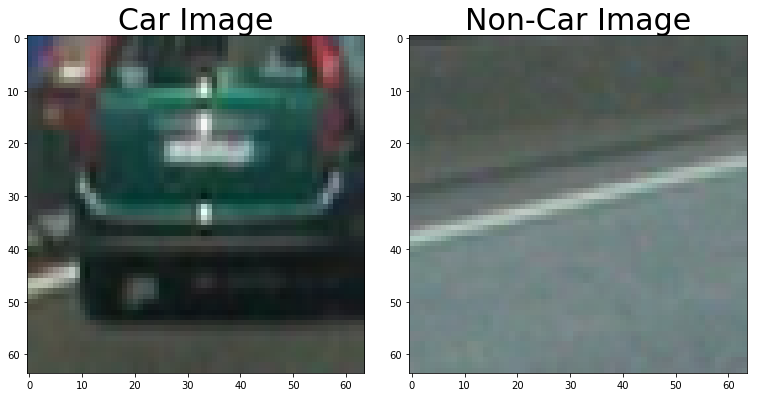

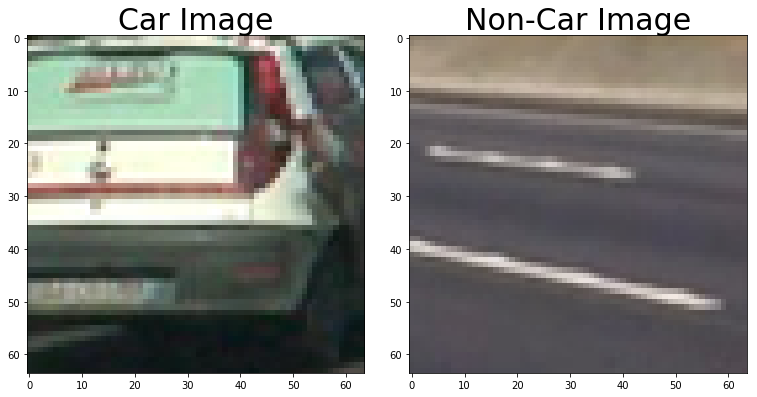

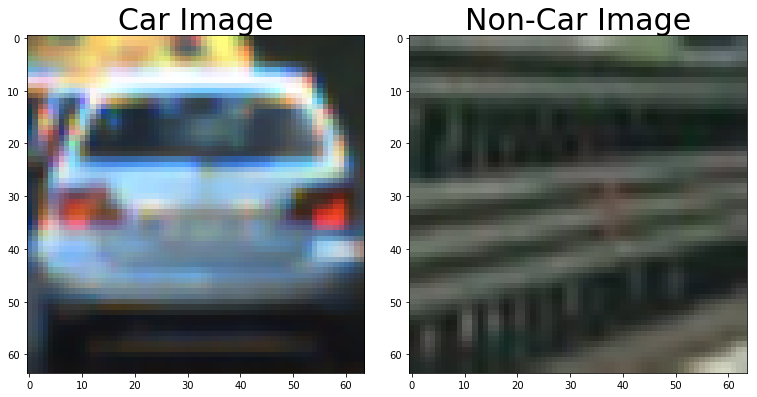

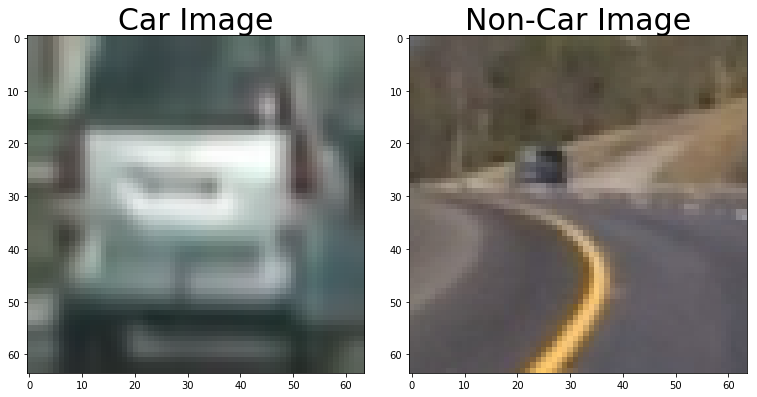

...

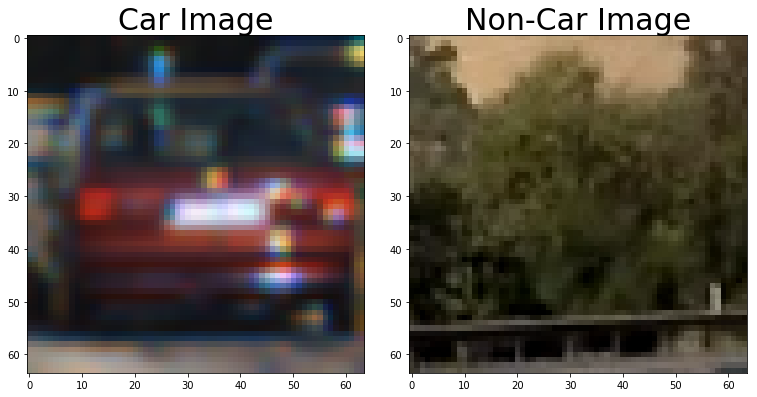

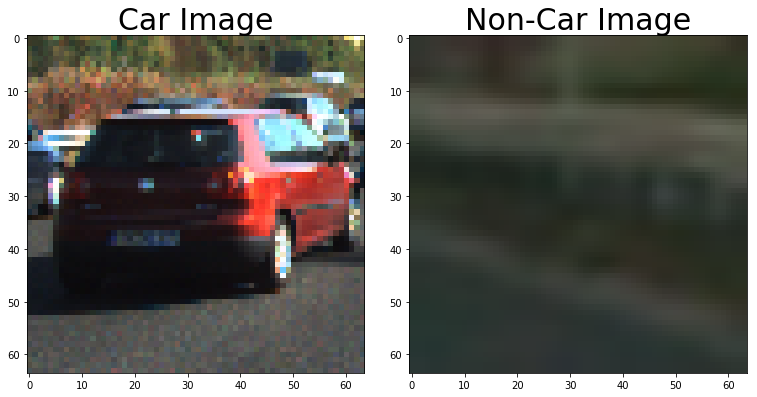

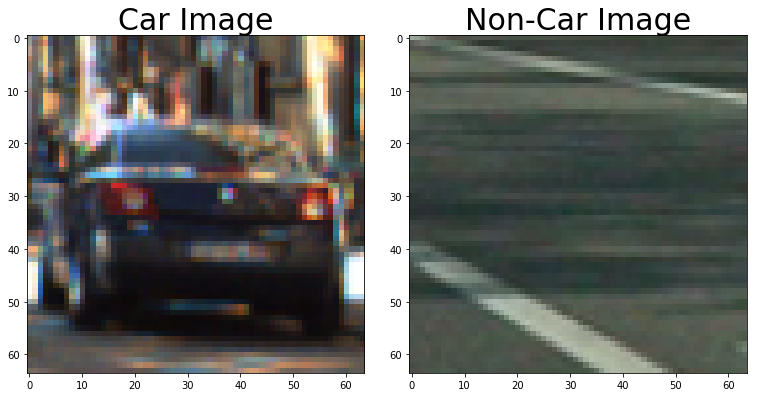

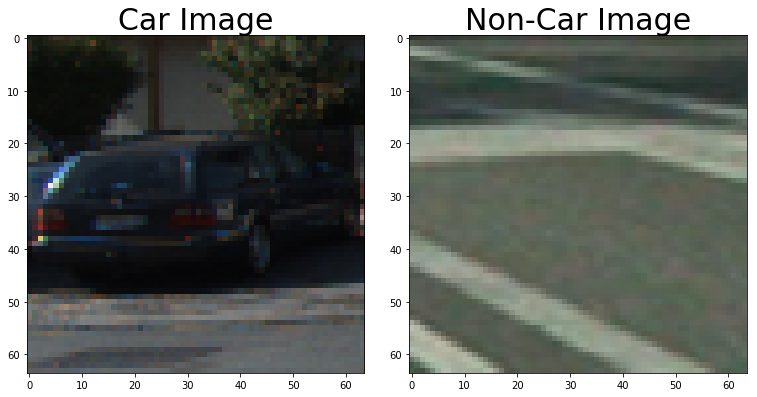

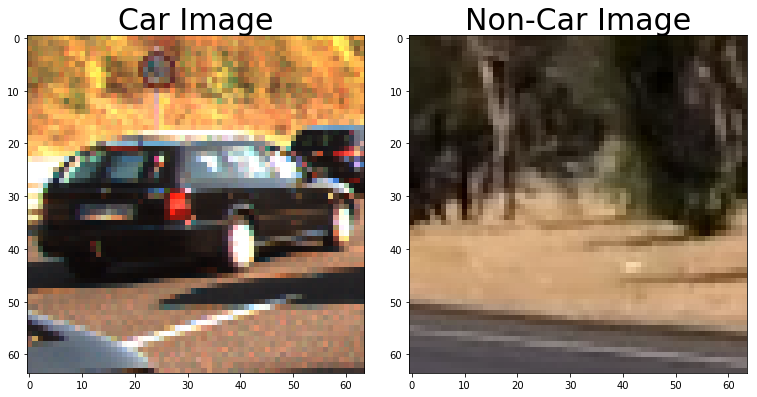

In [2]:
# Explore data
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

for i in range(20):
    car = cv2.imread(vehicles[np.random.randint(0,len(vehicles))]) 
    non_car = cv2.imread(non_vehicles[np.random.randint(0,len(non_vehicles))])
    
    # Print example of car and non-car
    if i == 1:
        cv2.imwrite('output_images/Car_Image.jpg', car)
        cv2.imwrite('output_images/Non-Car_Image.jpg', non_car)
    
    figure, axes = plt.subplots(1,2, figsize=(10, 10))
    figure.tight_layout()

    #axes[0].set_axis_off()
    axes[0].imshow(cv2.cvtColor(car, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Car Image', fontsize=30)
    
    axes[1].imshow(cv2.cvtColor(non_car, cv2.COLOR_BGR2RGB))
    axes[1].set_title('Non-Car Image', fontsize=30)
    
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    

## Feature extraction functions from class

### Spatial binning of color

In [3]:

def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    return features

### Histogram of colors

In [4]:
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

### HOG features

In [5]:
from skimage.feature import hog

# Define a function to return HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), block_norm= 'L2-Hys',
                                  transform_sqrt=True, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), block_norm= 'L2-Hys',
                       transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features




In [6]:
# Try cv2.HOGDescriptor
def get_cv2_hog_features(image, winSize = (64,64),\
                                blockSize = (16,16),\
                                blockStride = (8,8),\
                                cellSize = (8,8),\
                                nbins = 9, \
                                cspace = 'YCrCb'):
    if cspace != 'RGB':
        if cspace == 'HSV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        elif cspace == 'LUV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
        elif cspace == 'HLS':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
        elif cspace == 'YUV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
        elif cspace == 'YCrCb':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(image)
        
    hog = cv2.HOGDescriptor(winSize,blockSize,blockStride,cellSize,nbins)
    return np.ravel(hog.compute(feature_image))

### Function to extract and combine all three features above

In [7]:
def extract_features(image):
    # Extract parameters.
    cspace = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
    orient = 8
    pix_per_cell = 8
    cell_per_block = 2
    hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
    spatial_size = (16, 16)
    hist_bins = 32
    hist_range = (0, 256)

    if cspace != 'RGB':
        if cspace == 'HSV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        elif cspace == 'LUV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
        elif cspace == 'HLS':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
        elif cspace == 'YUV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
        elif cspace == 'YCrCb':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(image)      

    # Call get_hog_features() with vis=False, feature_vec=True
    if hog_channel == 'ALL':
        hog_features = []
        for channel in range(feature_image.shape[2]):
            hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))
        hog_features = np.ravel(hog_features)        
    else:
        hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        
    # Apply bin_spatial() to get spatial color features
    spatial_features = bin_spatial(feature_image, size=spatial_size)
    # Apply color_hist() also with a color space option now
    hist_features = color_hist(feature_image, nbins=hist_bins, bins_range=hist_range)

    # Return list of feature vectors
    return np.concatenate((spatial_features, hist_features, hog_features))

In [8]:
def extract_cv2hog_features(image):
    cspace = 'YCrCb'
    winSize = (64,64)
    blockSize = (16,16)
    blockStride = (8,8)
    cellSize = (8,8)
    nbins = 9
    
    if cspace != 'RGB':
        if cspace == 'HSV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        elif cspace == 'LUV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
        elif cspace == 'HLS':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
        elif cspace == 'YUV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
        elif cspace == 'YCrCb':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(image) 
        
    hog_features = []
    hog_features.append(get_cv2_hog_features(feature_image, winSize,\
                                blockSize,\
                                blockStride,\
                                cellSize,\
                                nbins))
    hog_features = np.ravel(hog_features)
                        
    # Apply bin_spatial() to get spatial color features
    spatial_features = bin_spatial(feature_image, size=spatial_size)
    # Apply color_hist() also with a color space option now
    hist_features = color_hist(feature_image, nbins=hist_bins, bins_range=hist_range)
    return np.concatenate((spatial_features, hist_features, hog_features))
                        

### Extract features

In [9]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import time

cspace = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 8
pix_per_cell = 8
cell_per_block = 2
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16)
hist_bins = 32
hist_range = (0, 256)

t=time.time()

#car_features = list(map(lambda car: extract_features(car), cars ))
car_features = list(map(lambda car: extract_cv2hog_features(car), cars ))

#notcar_features = list(map(lambda notcar: extract_features(notcar), non_cars ))
notcar_features = list(map(lambda notcar: extract_cv2hog_features(notcar), non_cars ))

t2 = time.time()
print(round(t2-t, 2), 'Seconds to extract HOG features...')

# Create an array stack of feature vectors
X = np.vstack((car_features, notcar_features)).astype(np.float64)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=rand_state)
    
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X_train)
# Apply the scaler to X
X_train = X_scaler.transform(X_train)
X_test = X_scaler.transform(X_test)

print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))


10.55 Seconds to extract HOG features...
Using: 8 orientations 8 pixels per cell and 2 cells per block
Feature vector length: 2628


### Train SVM classifier

In [26]:
# Train SVM classifier
from sklearn.svm import LinearSVC

# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
# Check the prediction time for a single sample
t=time.time()
n_predict = 10
print('My SVC predicts: ', svc.predict(X_test[0:n_predict]))
print('For these',n_predict, 'labels: ', y_test[0:n_predict])
t2 = time.time()
print(round(t2-t, 5), 'Seconds to predict', n_predict,'labels with SVC')

5.2 Seconds to train SVC...
Test Accuracy of SVC =  0.9868
My SVC predicts:  [1. 0. 0. 0. 1. 0. 0. 1. 1. 0.]
For these 10 labels:  [1. 0. 0. 0. 1. 0. 0. 1. 1. 0.]
0.00094 Seconds to predict 10 labels with SVC


In [10]:
# Following suggestion and try another classifier to 
# achieve at leat 99% accuracy
from sklearn.neural_network import MLPClassifier
# Try MLP classifier
mlp=MLPClassifier(random_state=777)
# Check the training time for the MLP
t=time.time()
mlp.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train MLP...')
# Check the score of the SVC
print('Test Accuracy of MLP = ', round(mlp.score(X_test, y_test), 4))
# Check the prediction time for a single sample
t=time.time()
n_predict = 10
print('My MLP predicts: ', mlp.predict(X_test[0:n_predict]))
print('For these',n_predict, 'labels: ', y_test[0:n_predict])
t2 = time.time()
print(round(t2-t, 5), 'Seconds to predict', n_predict,'labels with MLP')

6.26 Seconds to train MLP...
Test Accuracy of MLP =  0.9966
My MLP predicts:  [1. 1. 0. 1. 1. 1. 1. 0. 0. 0.]
For these 10 labels:  [1. 1. 0. 1. 1. 1. 1. 0. 0. 0.]
0.00158 Seconds to predict 10 labels with MLP


### Visualize Histogram Oriented Gradients (HOG)

#### Cars

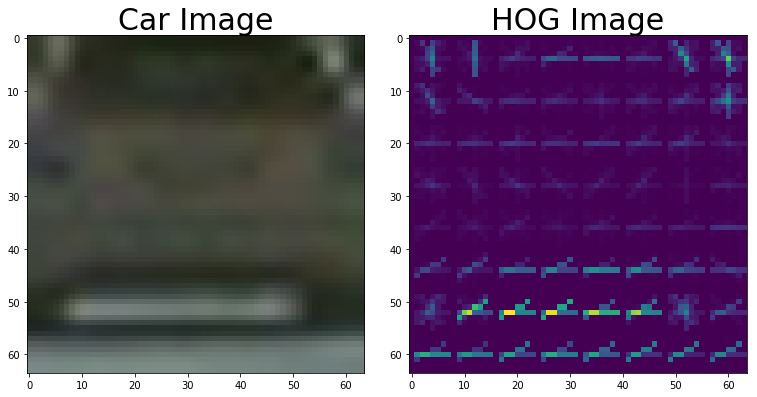

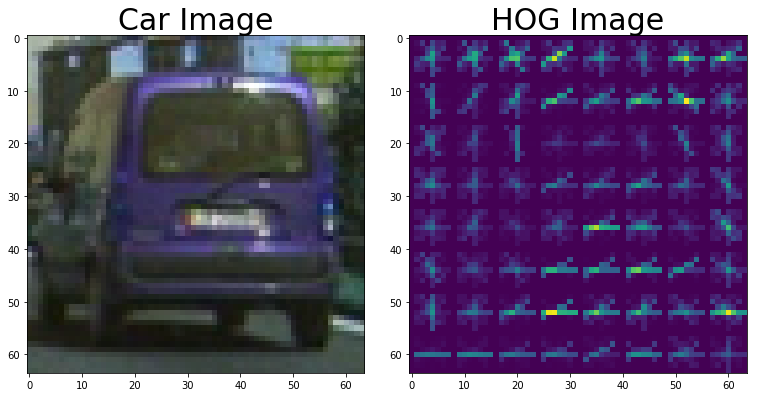

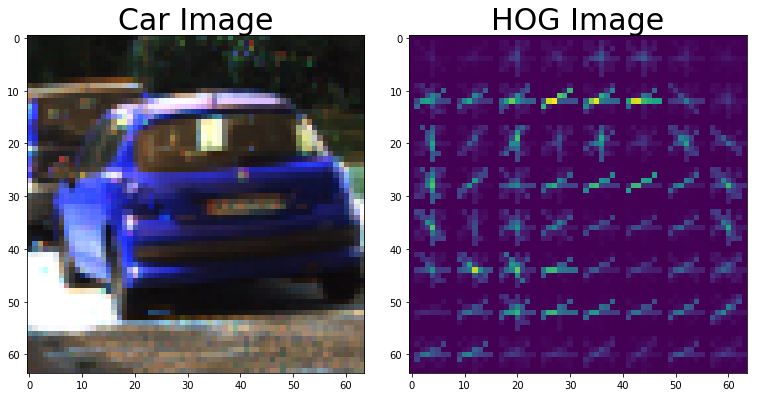

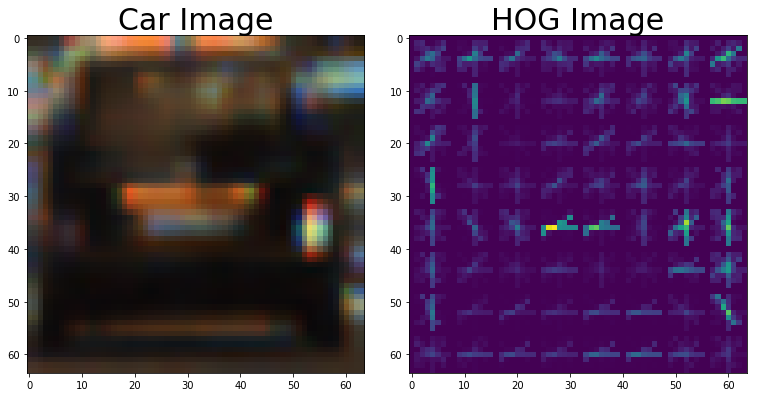

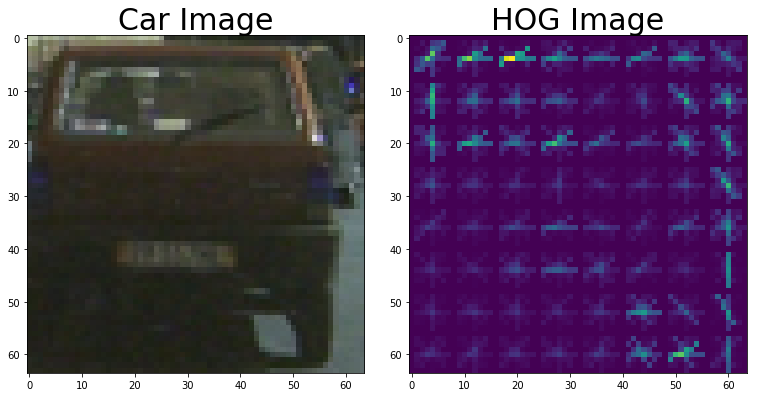

...

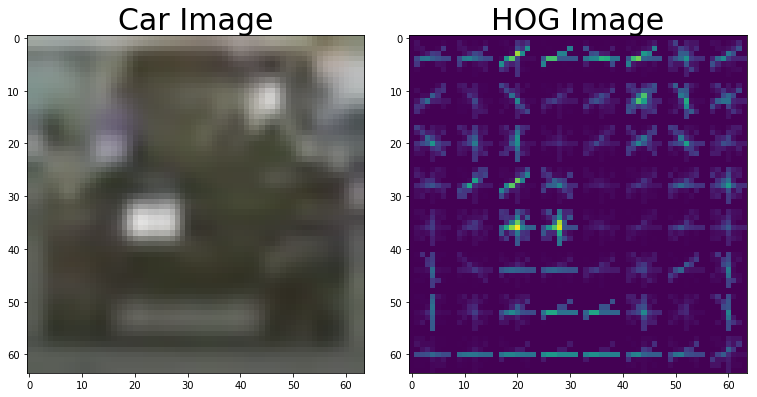

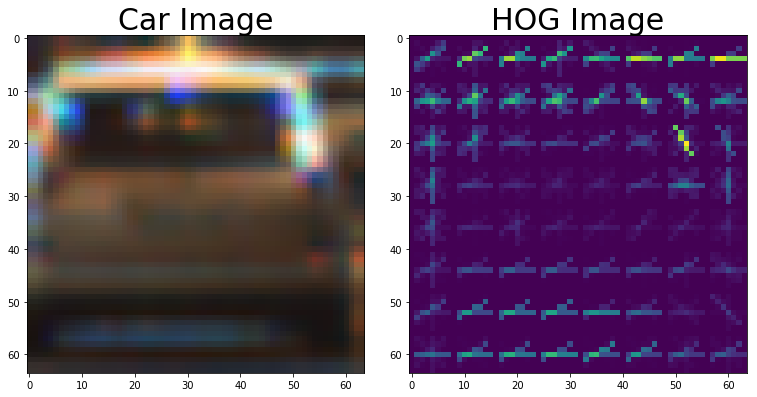

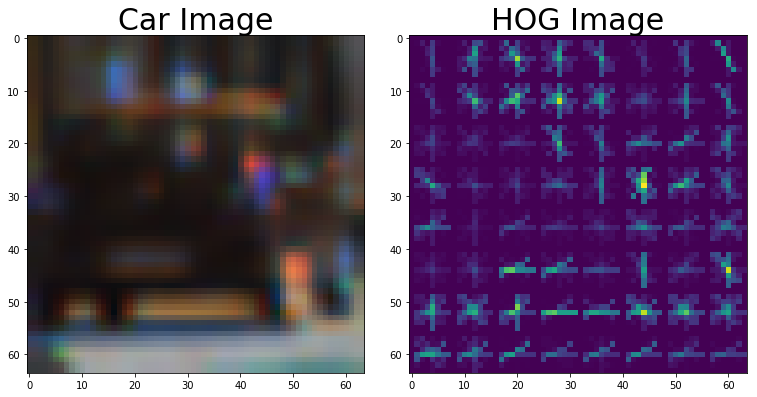

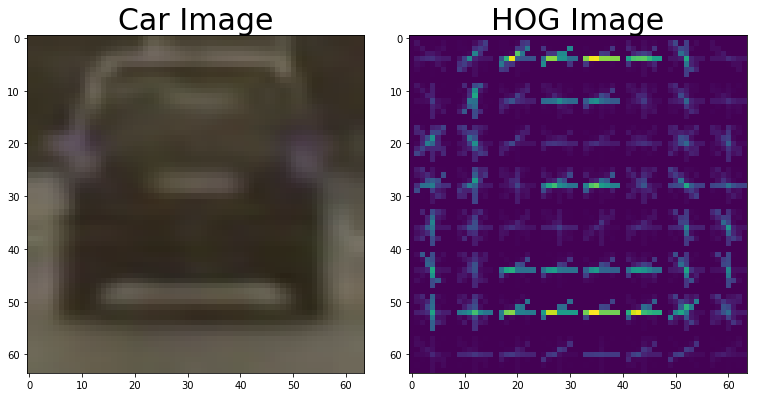

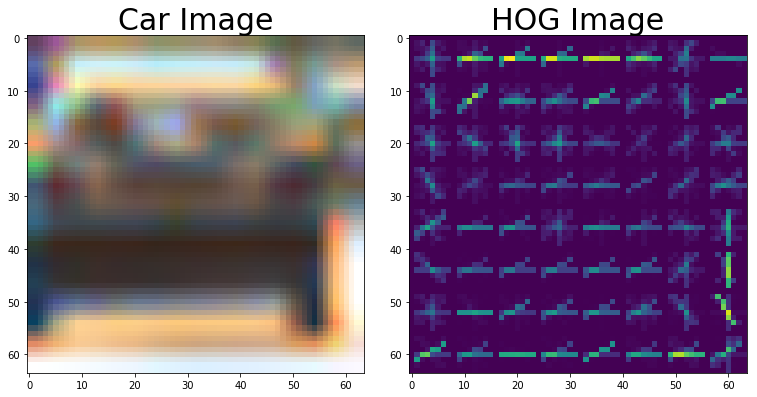

In [15]:

for i in range(20):
    car = cv2.imread(vehicles[np.random.randint(0,len(vehicles))]) 
    _, car_hog = get_hog_features(car[:,:,2], orient, pix_per_cell, cell_per_block, 
                        vis=True, feature_vec=True)
    #car_hog = get_cv2_hog_features(car)
    
    # Print HOG examples of car and non-car
    if i == 1:
        cv2.imwrite('output_images/Before_HOG.jpg', car)
        cv2.imwrite('output_images/After_HOG.png', car_hog)
    
    figure, axes = plt.subplots(1,2, figsize=(10, 10))
    figure.tight_layout()

    #axes[0].set_axis_off()
    axes[0].imshow(car)
    axes[0].set_title('Car Image', fontsize=30)
    
    axes[1].imshow(car_hog)
    axes[1].set_title('HOG Image', fontsize=30)
    
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#### Non-cars

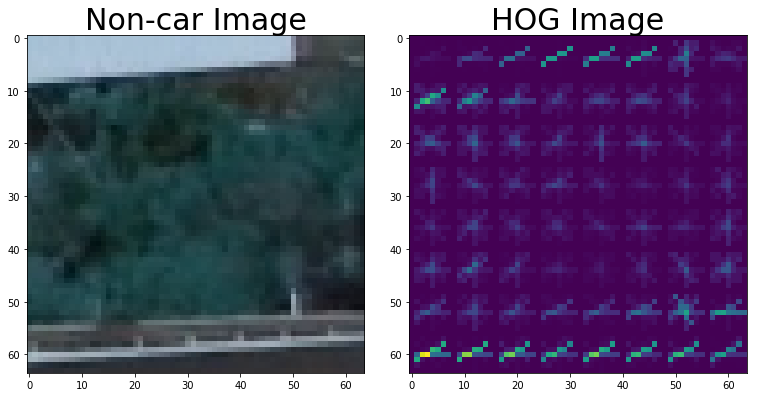

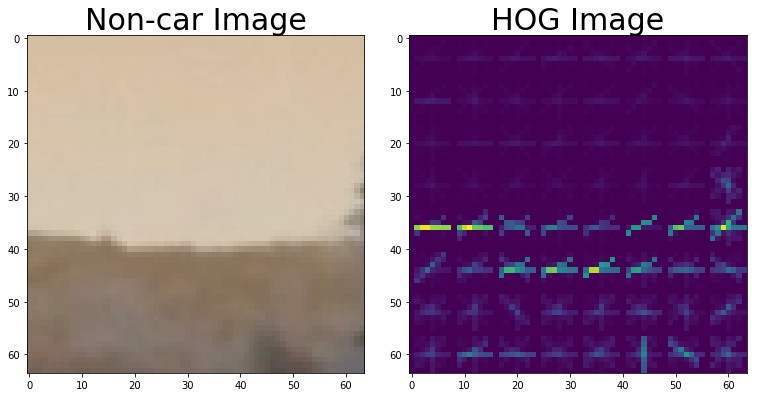

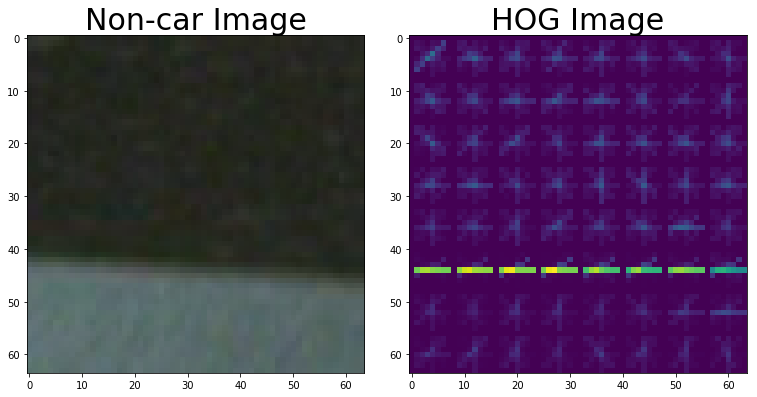

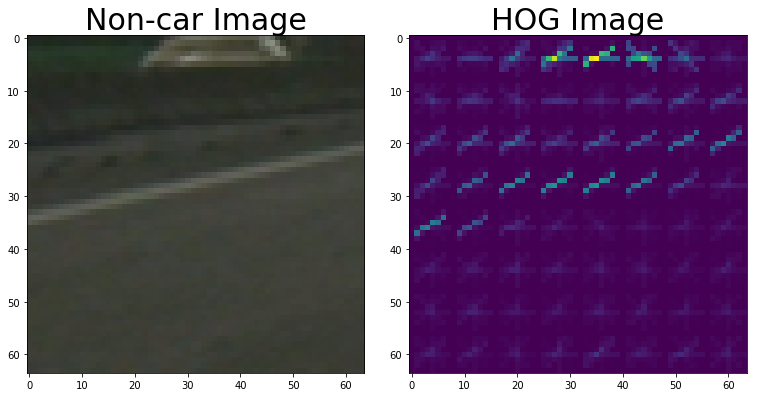

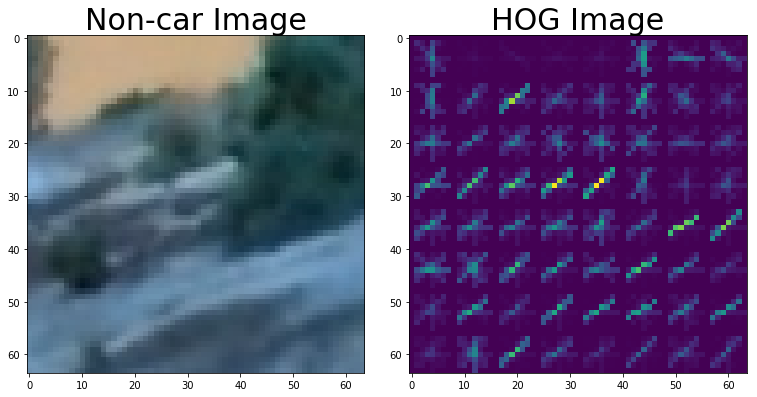

...

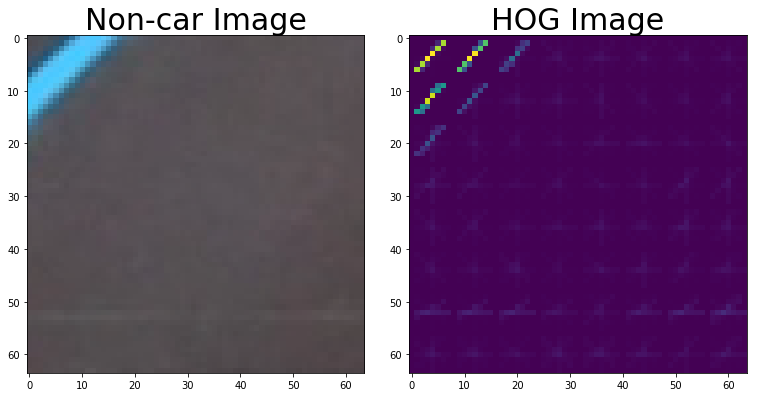

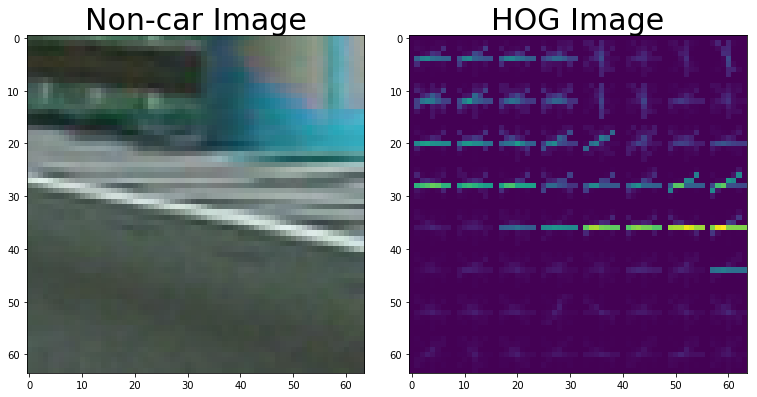

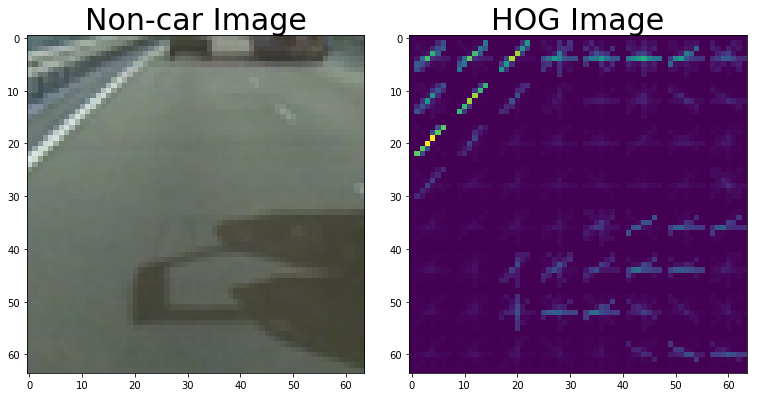

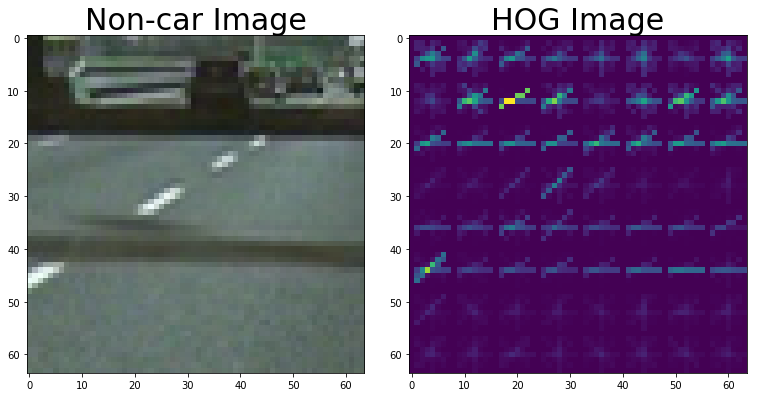

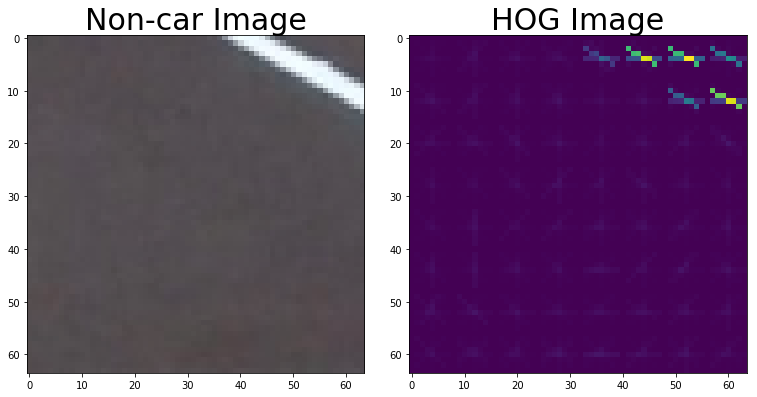

In [28]:
for i in range(20):
    non_car = cv2.imread(non_vehicles[np.random.randint(0,len(non_vehicles))]) 
    _, noncar_hog = get_hog_features(non_car[:,:,2], orient, pix_per_cell, cell_per_block, 
                        vis=True, feature_vec=True)
    
    figure, axes = plt.subplots(1,2, figsize=(10, 10))
    figure.tight_layout()

    #axes[0].set_axis_off()
    axes[0].imshow(non_car)
    axes[0].set_title('Non-car Image', fontsize=30)
    
    axes[1].imshow(noncar_hog)
    axes[1].set_title('HOG Image', fontsize=30)
    
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Sliding window and search for car

In [16]:
import matplotlib.image as mpimg

# Here is your draw_boxes function from the previous exercise
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy
    
    
# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list


In [17]:
#def search_windows(img, windows, clf, scaler, color_space, 
#                    spatial_size, hist_bins, 
#                    hist_range, orient, 
#                    pix_per_cell, cell_per_block, 
#                    hog_channel, spatial_feat, 
#                    hist_feat, hog_feat):
def search_windows(img, windows, clf, scaler):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_window = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using single_img_features()
        #features = extract_features(test_window)
        features = extract_cv2hog_features(test_window)
        #5) Scale extracted features to be fed to classifier
        img_features = scaler.transform(np.array(features).reshape(1, -1))         
        #6) Predict using your classifier and distance away from decision boundary
        #prediction = svc.predict(img_features)
        #confidence = svc.decision_function(img_features)
        #
        # If positive (prediction == 1) and above confidence threshold
        # then save the window
        #confidence_threshold = 0.5
        #if prediction == 1 and abs(confidence) > confidence_threshold:
        # Add MLP classifier
        if clf.predict_proba(img_features)[0][1] > 0.99:
                on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows

### Test  pipeline on test images

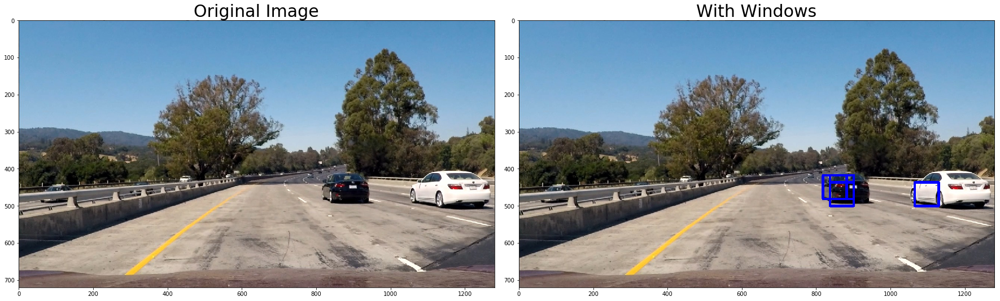

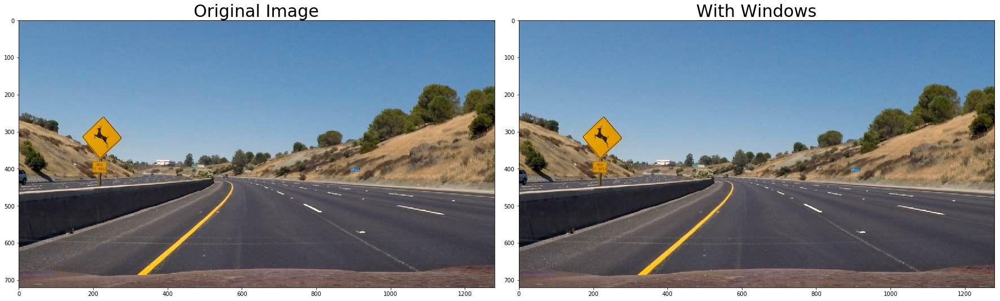

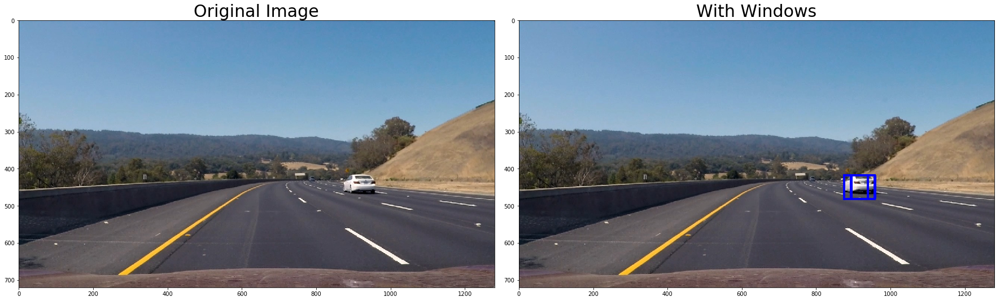

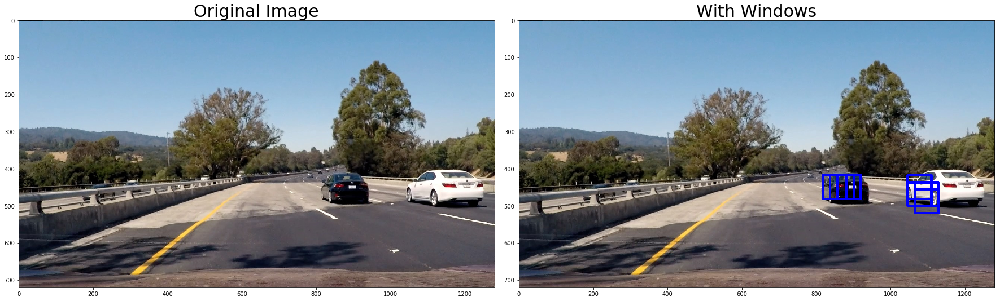

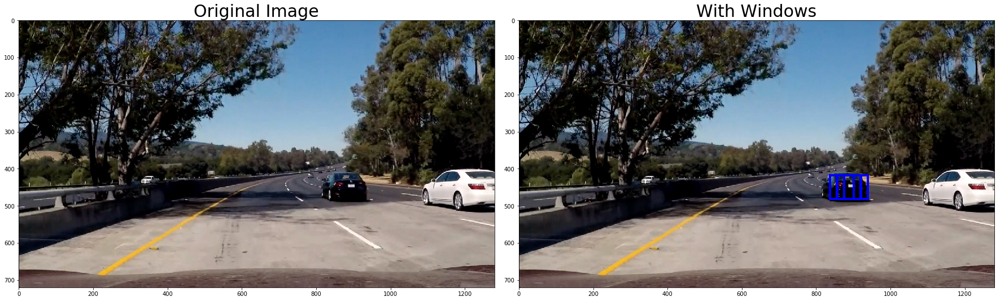

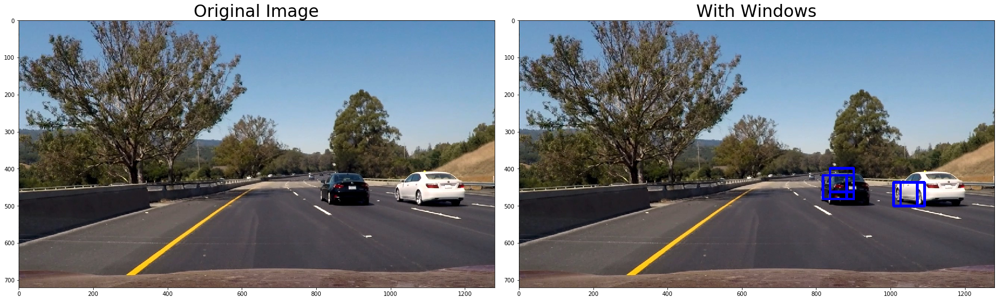

In [18]:
# Test pipeline on all test images
xy_window=(64, 64) 
xy_overlap=(0.7, 0.7)
y_start_stop = [360, 700] # Min and max in y to search in slide_window()


test_images = glob.glob('./test_images/test*.jpg')
for fname in test_images:
    test_img = cv2.cvtColor(cv2.imread(fname), cv2.COLOR_BGR2RGB) 
    draw_image = np.copy(test_img)
    
    windows = slide_window(test_img, x_start_stop=[None, None], y_start_stop=y_start_stop, 
                    xy_window=xy_window, xy_overlap=xy_overlap)
    bounding_boxes = []
    #bounding_boxes += (search_windows(test_img, windows, svc, X_scaler)) 
    bounding_boxes += (search_windows(test_img, windows, mlp, X_scaler))
    window_img = draw_boxes(draw_image, bounding_boxes, color=(0, 0, 255), thick=6)
    
    # Print examples of sliding windows
    if fname == './test_images/test1.jpg':
        cv2.imwrite('output_images/Before_slidingWindows.jpg', test_img)
        cv2.imwrite('output_images/After_slidingWindows.jpg', window_img)
    #plt.imshow(window_img)
    
    figure, axes = plt.subplots(1,2, figsize=(24, 9))
    figure.tight_layout()

    #axes[0].set_axis_off()
    axes[0].imshow(test_img)
    axes[0].set_title('Original Image', fontsize=30)
    
    axes[1].imshow(window_img)
    axes[1].set_title('With Windows', fontsize=30)
    
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Multiple Detections & False Positives

In [19]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import pickle
import cv2
from scipy.ndimage.measurements import label

def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img


In [20]:
def find_cars(img, xy_window, xy_overlap, y_start_stop, scale, clf, X_scaler):
    # Extract parameters.
    cspace = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
    scale = scale
    xy_window = xy_window 
    xy_overlap = xy_overlap
    y_start_stop = y_start_stop
    
    bboxes = []
        
    windows = slide_window(img, x_start_stop=[None, None], y_start_stop=y_start_stop, 
                    xy_window=xy_window, xy_overlap=xy_overlap)
    
    bboxes += (search_windows(img, windows, clf, X_scaler))                      
    
    return bboxes

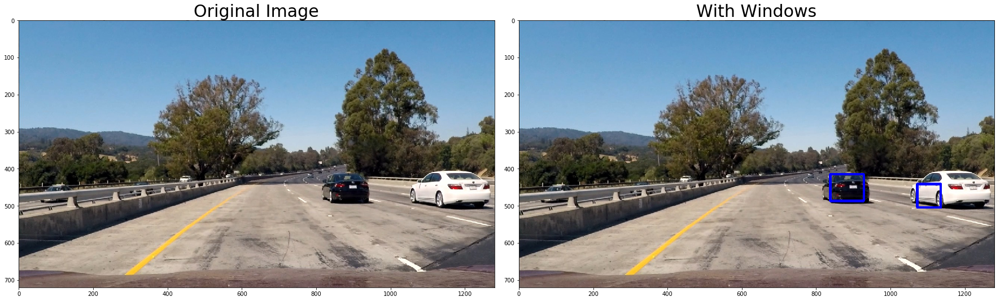

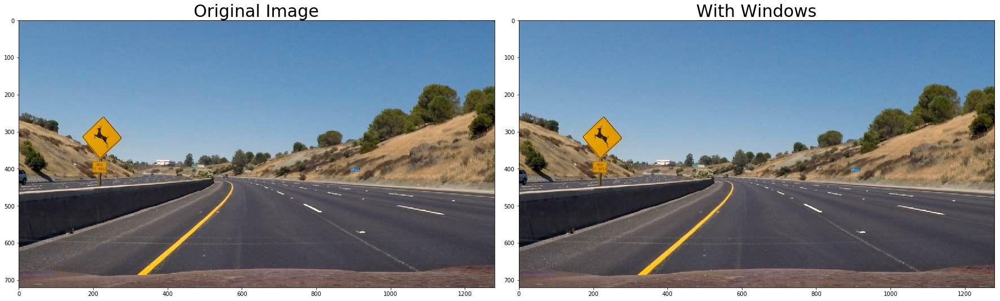

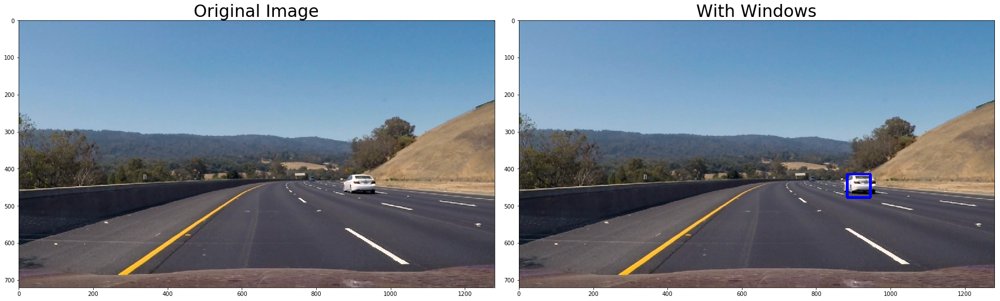

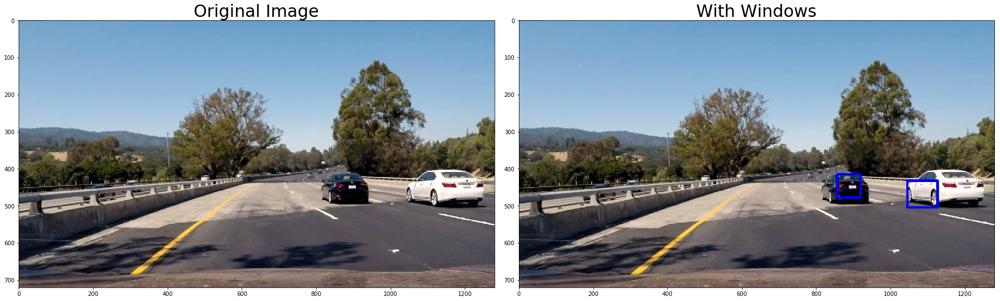

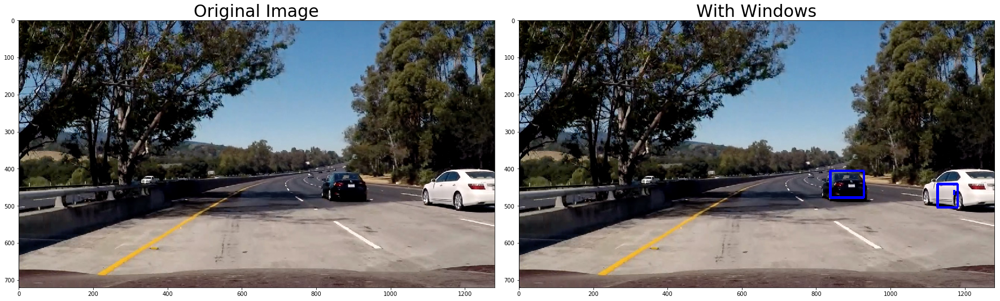

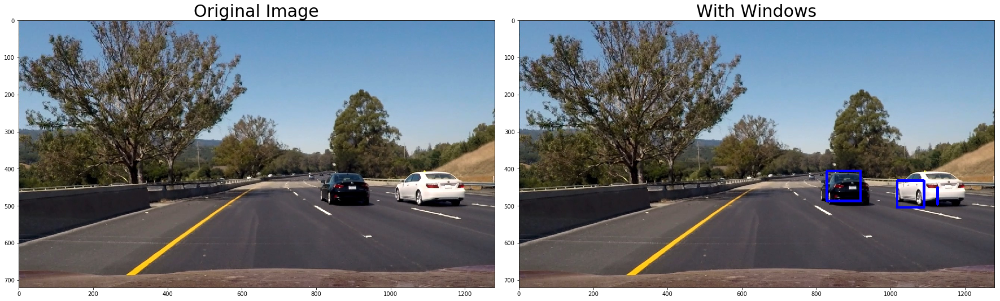

In [21]:
# Test find cars on all test images
#scale = 1.5
#xy_window=(64, 64) 
#xy_overlap=(0.85, 0.85)
#y_start_stop = [360, 700] # Min and max in y to search in slide_window()


test_images = glob.glob('./test_images/test*.jpg')
for fname in test_images:
    test_img = cv2.cvtColor(cv2.imread(fname), cv2.COLOR_BGR2RGB) 
    draw_image = np.copy(test_img)
    
    bboxes = find_cars(test_img, (64, 64),(0.85, 0.85),\
                       [360, 700], 1.5, mlp, X_scaler)                      

    # Add heat to each box in box list
    heat = np.zeros(draw_image.shape)
    heat = add_heat(heat,bboxes)
    
    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,4)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    out_img = draw_labeled_bboxes(draw_image, labels)
    
    # Print examples of HOG sub-sampling
    if fname == './test_images/test1.jpg':
        cv2.imwrite('output_images/Before_find_cars.jpg', test_img)
        cv2.imwrite('output_images/After_find_cars.jpg', out_img)
    
    figure, axes = plt.subplots(1,2, figsize=(24, 9))
    figure.tight_layout()

    #axes[0].set_axis_off()
    axes[0].imshow(test_img)
    axes[0].set_title('Original Image', fontsize=30)
    
    axes[1].imshow(out_img)
    axes[1].set_title('With Windows', fontsize=30)
    
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

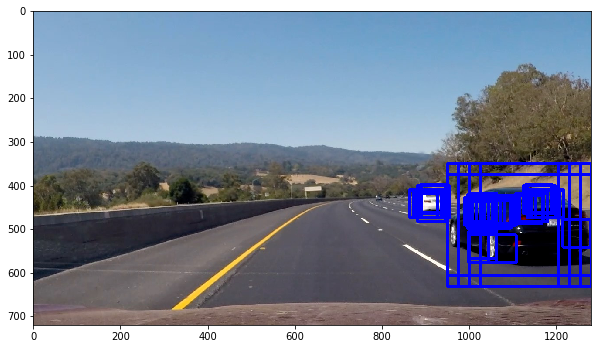

In [78]:
# Apply multiple sliding windows 
test_img = cv2.cvtColor(cv2.imread('./test_images/test7.jpg'), cv2.COLOR_BGR2RGB)
draw_image = np.copy(test_img)

boundingboxes = []

xy_window=(64, 64) 
xy_overlap=(0.8, 0.8)
y_start_stop = [350, 550]
scale = 2.0
boundingboxes.append(find_cars(test_img, xy_window, xy_overlap, y_start_stop, scale, mlp, X_scaler))


xy_window=(64, 64) 
xy_overlap=(0.85, 0.85)
y_start_stop = [400, 500]
scale = 2.0
boundingboxes.append(find_cars(test_img, xy_window, xy_overlap, y_start_stop, scale, mlp, X_scaler))


xy_window=(128, 128) 
xy_overlap=(0.85, 0.85)
y_start_stop = [450, 550]
scale = 2.0
boundingboxes.append(find_cars(test_img, xy_window, xy_overlap, y_start_stop, scale, mlp, X_scaler))


xy_window=(64, 64) 
xy_overlap=(0.85, 0.85)
y_start_stop = [450, 600]
scale = 2.0
boundingboxes.append(find_cars(test_img, xy_window, xy_overlap, y_start_stop, scale, mlp, X_scaler))


xy_window=(256, 256) 
xy_overlap=(0.9, 0.9)
y_start_stop = [350, 650]
scale = 2.0
boundingboxes.append(find_cars(test_img, xy_window, xy_overlap, y_start_stop, scale, mlp, X_scaler))

bboxes = [box for boxlist in boundingboxes for box in boxlist]
window_img = draw_boxes(draw_image, bboxes, color=(0, 0, 255), thick=6)
plt.figure(figsize=(10,10))
plt.imshow(window_img)

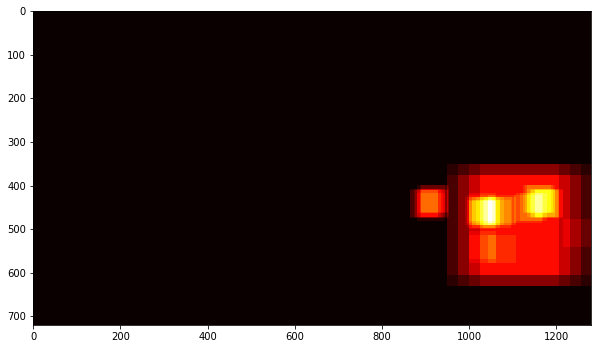

In [79]:
# Apply heatmap
heatmap = np.zeros_like(test_img[:,:,0])
heatmap = add_heat(heatmap, bboxes)
plt.figure(figsize=(10,10))
plt.imshow(heatmap, cmap='hot')

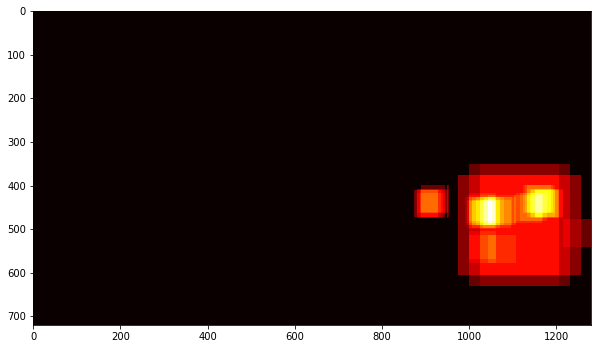

In [80]:
# Apply heatmap threshold
heatmap = apply_threshold(heatmap,2)
heatmap = np.clip(heatmap, 0, 255)
plt.figure(figsize=(10,10))
plt.imshow(heatmap, cmap='hot')

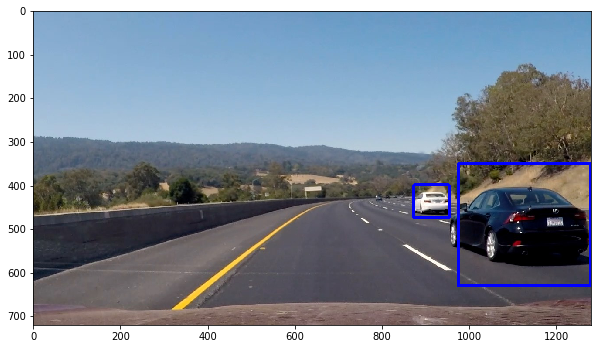

In [81]:
# Find final boxes from heatmap using label function
labels = label(heatmap)
out_img = draw_labeled_bboxes(draw_image, labels)
plt.figure(figsize=(10,10))
plt.imshow(out_img)

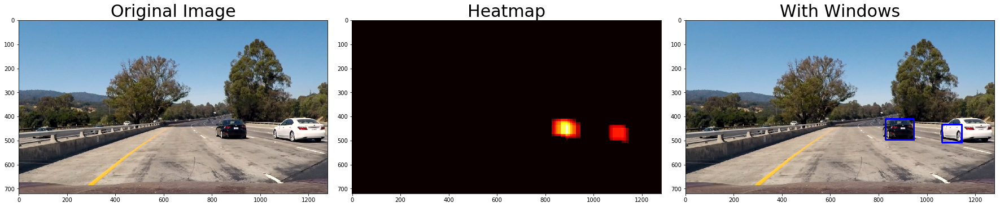

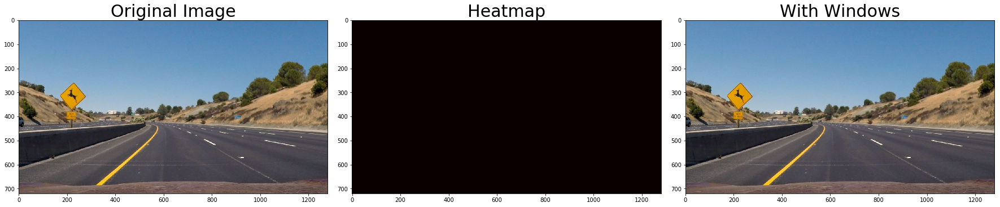

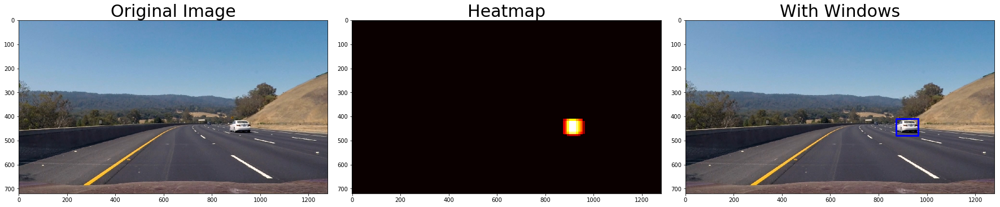

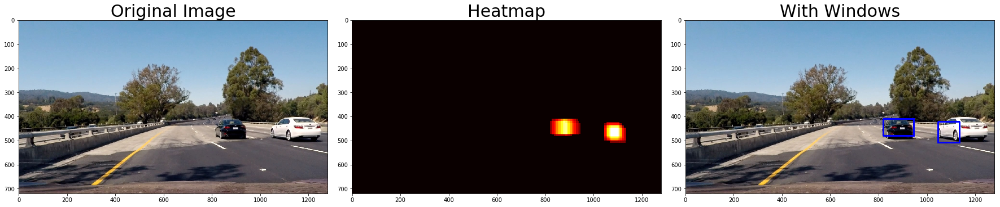

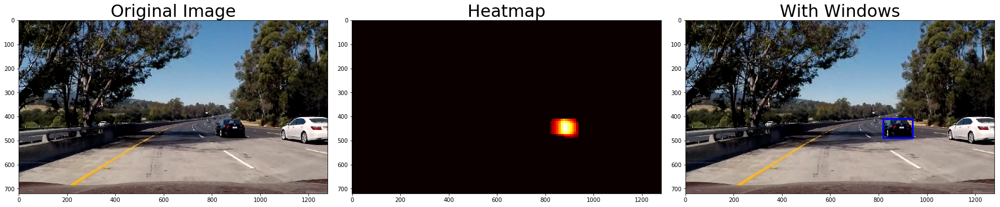

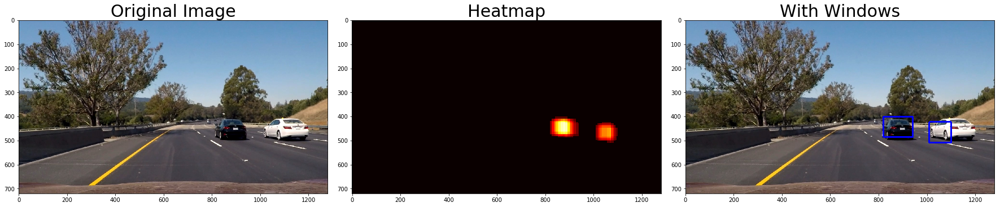

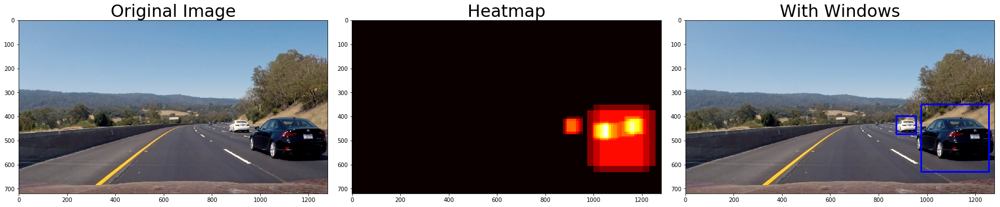

In [82]:
# Put all together and test on all test images
xy_window=(64, 64) 
xy_overlap=(0.85, 0.85)
y_start_stop = [360, 700] # Min and max in y to search in slide_window()


test_images = glob.glob('./test_images/test*.jpg')
for fname in test_images:
    rgb_img = cv2.cvtColor(cv2.imread(fname), cv2.COLOR_BGR2RGB) 
    draw_image = np.copy(rgb_img)
    
    bounding_boxes = []

    bounding_boxes.append(find_cars(rgb_img, (64, 64), (0.8, 0.8), [350, 550], 2.0, mlp, X_scaler))

    bounding_boxes.append(find_cars(rgb_img, (64, 64), (0.85, 0.85), [400, 500], 2.0, mlp, X_scaler))

    bounding_boxes.append(find_cars(rgb_img, (128, 128), (0.85, 0.85), [450, 550], 2.0, mlp, X_scaler))

    bounding_boxes.append(find_cars(rgb_img, (256, 256), (0.9, 0.9), [350, 650], 2.0, mlp, X_scaler))
    
    bboxes = [box for boxlist in bounding_boxes for box in boxlist]
    
    # Add heat to each box in box list
    #heat = np.zeros(draw_image.shape)
    heatmap = np.zeros_like(rgb_img[:,:,0])
    heatmap = add_heat(heatmap,bboxes)
    
    # Apply threshold to help remove false positives
    heatmap = apply_threshold(heatmap,2)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heatmap, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    out_img = draw_labeled_bboxes(draw_image, labels)
    
    #window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=6)
    
    # Print examples of heatmaps and labels
    if fname == './test_images/test1.jpg':
        cv2.imwrite('output_images/Before_HeatmapAndLabels.jpg', rgb_img)
        cv2.imwrite('output_images/After_HeatmapAndLabels.jpg', out_img)
    
    figure, axes = plt.subplots(1,3, figsize=(24, 9))
    figure.tight_layout()

    #axes[0].set_axis_off()
    axes[0].imshow(rgb_img)
    axes[0].set_title('Original Image', fontsize=30)
    
    axes[1].imshow(heatmap, cmap='hot')
    axes[1].set_title('Heatmap', fontsize=30)
    
    axes[2].imshow(out_img)
    axes[2].set_title('With Windows', fontsize=30)
    
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [87]:
def find_cars_bboxes(rgb_img, clf, X_scaler): 
    
    bounding_boxes = []

    bounding_boxes.append(find_cars(rgb_img, (64, 64), (0.8, 0.8), [350, 550], 2.0, clf, X_scaler))

    bounding_boxes.append(find_cars(rgb_img, (64, 64), (0.85, 0.85), [400, 500], 2.0, clf, X_scaler))

    bounding_boxes.append(find_cars(rgb_img, (128, 128), (0.85, 0.85), [450, 550], 2.0, clf, X_scaler))

    bounding_boxes.append(find_cars(rgb_img, (256, 256), (0.9, 0.9), [350, 650], 2.0, clf, X_scaler))
    
    bboxes = [box for boxlist in bounding_boxes for box in boxlist]                      
    
    return bboxes

In [88]:
class Detected_Vehicle:
    def __init__(self):
        self.boxes = []
    def append_detected_boxes(self, bboxes):
        self.boxes.append(bboxes)
        # Keep, say 10 frames of same detected car, and discard oldest one
        if len(self.boxes) > 3:
            self.boxes = self.boxes[1:]

def find_heatmap(rgb_img, bboxes):
    
    heatmap = np.zeros_like(rgb_img[:,:,0])
    if len(bboxes) > 0:
        detected_cars.append_detected_boxes(bboxes)
        
    for boxes in detected_cars.boxes:
        heatmap = add_heat(heatmap,boxes)
    heatmap_frame = apply_threshold(heatmap, 12)
    return label(heatmap_frame)
    


In [89]:
# Define a function to process video
def process_video(img):
    
    rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    draw_img = np.copy(rgb_img)
    
    boundboxes =find_cars_bboxes(rgb_img, mlp, X_scaler)

    carlabels = find_heatmap(rgb_img, boundboxes)
    
    out_img = draw_labeled_bboxes(draw_img, carlabels)
    
    return cv2.cvtColor(out_img, cv2.COLOR_RGB2BGR)
    

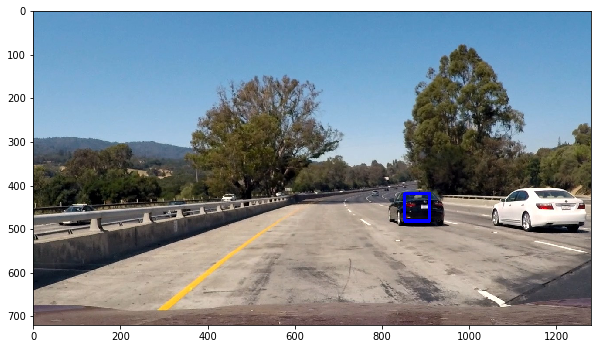

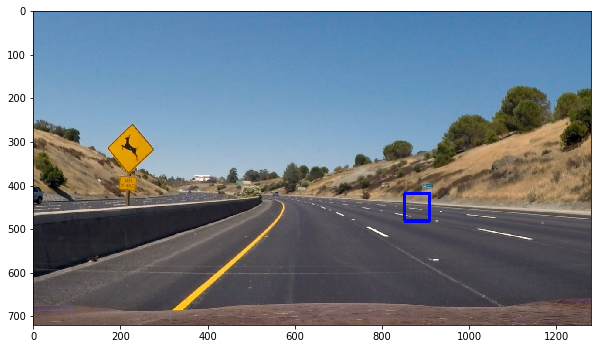

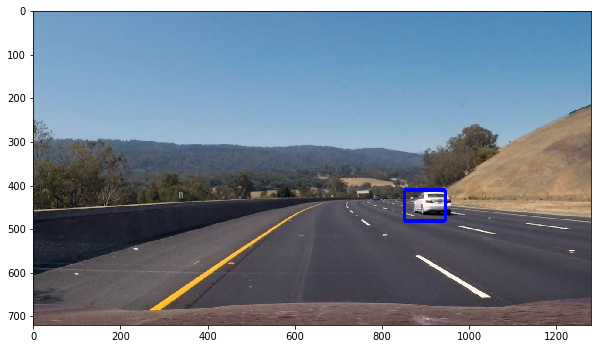

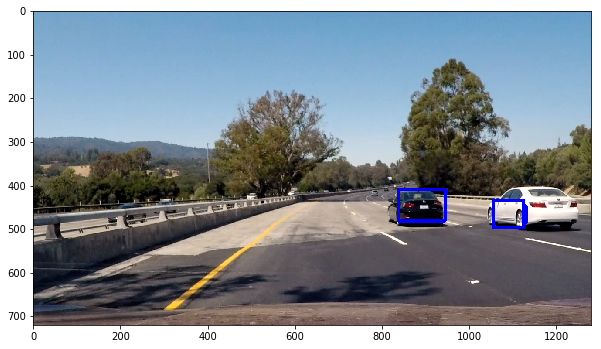

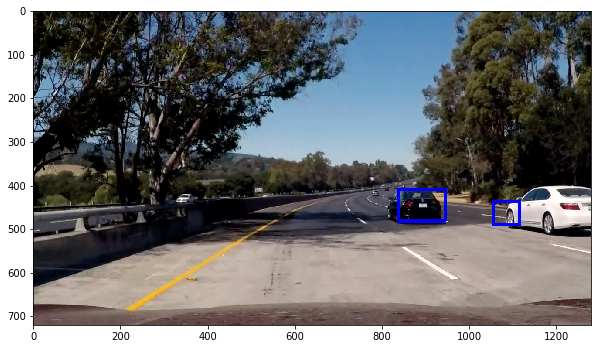

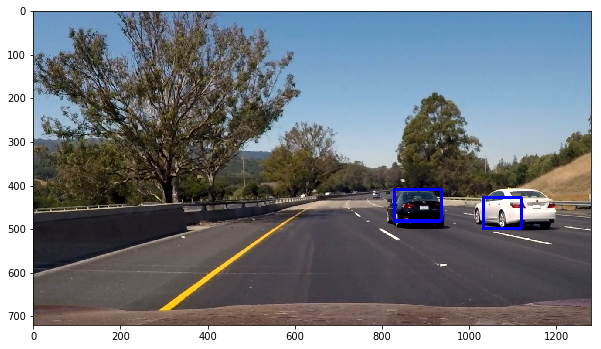

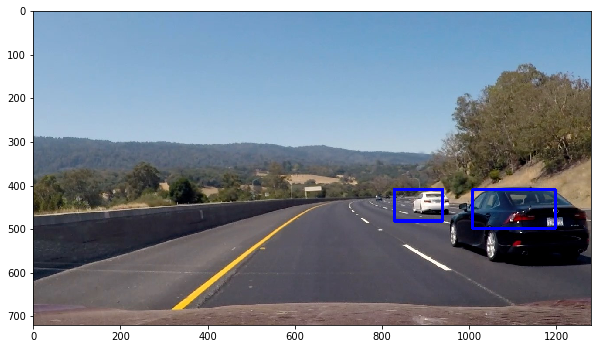

In [85]:
# Testing process_video 
#test_images = glob.glob('./trouble_images/bad*.jpg')
test_images = glob.glob('./test_images/test*.jpg')
detected_cars = Detected_Vehicle()
for fname in test_images:
    test_img = cv2.imread(fname)
    out_img = cv2.cvtColor(process_video(test_img), cv2.COLOR_RGB2BGR)
    plt.figure(figsize=(10,10))
    plt.imshow(out_img)

### Video Implementation

In [91]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

detected_cars = Detected_Vehicle()

#video_input = './test_images/3s_clip.mp4'
#video_output = 'output_images/VehicleDetection_video_3s_out.mp4'

#video_input = './test_images/10s_clip.mp4'
#video_output = 'output_images/VehicleDetection_video_10s_out.mp4'

video_input = './short_project_video.mp4'
video_output = 'output_images/VehicleDetection_video_out4.mp4'

video_clip = VideoFileClip(video_input)
processed_video = video_clip.fl_image(process_video)
%time processed_video.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video output_images/VehicleDetection_video_out4.mp4
[MoviePy] Writing video output_images/VehicleDetection_video_out4.mp4


100%|█████████▉| 815/816 [27:49<00:02,  2.04s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/VehicleDetection_video_out4.mp4 

CPU times: user 1h 7min 35s, sys: 29min 14s, total: 1h 36min 50s
Wall time: 27min 50s
